In [24]:
import pandas as pd
import numpy as np
import json
import os
import datetime as dt

# plotting
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import autocorrelation_plot
sns.set_style("dark")

# custom functions
import functions

# vader sentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [4]:
# set up tweets
fp = 'data/tweets/raw/netflix_tweets_v2.json'

tweets = []
for line in open(fp, 'r'):
    tweets.append(json.loads(line))

tweets_df = pd.DataFrame(tweets)

In [5]:
# remove duplicates
tweets_df.drop_duplicates(subset='tweet_id', inplace=True)
tweets_df.shape

(51643, 4)

In [6]:
# sentiment analysis
analyzer = SentimentIntensityAnalyzer()
compound_scores = []
for sentence in tweets_df['tweet_text']:
    vs = analyzer.polarity_scores(sentence)
    print(str(vs)+' ##### '+sentence)
    compound_scores.append(vs['compound'])

{'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.8908} ##### About 80% of @Netflix subscribers usually watch with subtitles or closed captions (though only ~25% of those aged 56-75). 
Many of #Netflix’s best shows, including its most popular show to date, @NetflixKR's Squid Game, are enjoyed by audiences who can't understand the language.
{'neg': 0.0, 'neu': 0.76, 'pos': 0.24, 'compound': 0.8602} ##### @DiscussingFilm @MTVNEWS #blockbuster #BlackPantherWakandaForever #movies #netflix #film #acting #rent #nfts
https://t.co/ZyUeiFUBNh
BLOCKBUSTER VIDEO AUTHENTIC MEMBERSHIP CARD NOSTALGIA 80'S 90'S NFT
only 10 remaining in the world🌍
{'neg': 0.109, 'neu': 0.552, 'pos': 0.339, 'compound': 0.9337} ##### Gremlins #KZN soon on #Netflix'e Mfs😉😂🤣😂😂🤣
Duma #ANCKZNconference 
#VoetsekANC https://t.co/dBaLtpbkOY
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0} ##### @TenzilaMazhar Stranger Things.
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0} ##### Counting the days till #Extraor

compound score meanings: <br>
positive sentiment: compound score >= 0.05 <br>
neutral sentiment: (compound score > -0.05) and (compound score < 0.05) <br>
negative sentiment: compound score <= -0.05 <br>

In [7]:
# merge values back to df
tweets_df['compound_scores'] = compound_scores
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51643 entries, 0 to 51642
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tweet_id         51643 non-null  object 
 1   author_id        51643 non-null  object 
 2   created_at       51643 non-null  object 
 3   tweet_text       51643 non-null  object 
 4   compound_scores  51643 non-null  float64
dtypes: float64(1), object(4)
memory usage: 2.4+ MB


In [12]:
# turn dates to datetime
tweets_df['created_at'] = pd.to_datetime(tweets_df['created_at'])
tweets_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 51643 entries, 0 to 51642
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   tweet_id         51643 non-null  object             
 1   author_id        51643 non-null  object             
 2   created_at       51643 non-null  datetime64[ns, UTC]
 3   tweet_text       51643 non-null  object             
 4   compound_scores  51643 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(1), object(3)
memory usage: 2.4+ MB


<AxesSubplot:ylabel='Count'>

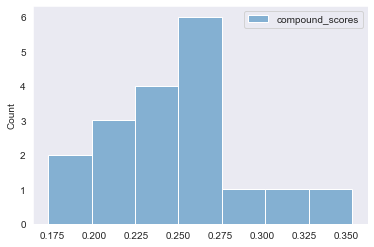

In [32]:
daily_tweets = tweets_df.groupby([tweets_df['created_at'].dt.date]).mean()
sns.histplot(daily_tweets)

In [33]:
daily_tweets.to_csv('data/tweets/classified/tweets_mean_sentiment.csv')